# Descripcion del hardware

Procesador: Intel(R) Core(TM) i5 8300H CPU @ 2.3GHz 2.3GHz

Ram: 20 Gb

Optane: 20 Gb

Vram: 4Gb

Tarjeta de video: Nvidia  GeForce GTX 1050 @ compute capability: 6.1

# Descripcion de los datos

El conjunto de datos sobre el cual trabajeremos consiste de 8.189 flores en diferentes resoluciones con gran variedad de tamaños, formas y colores, el cual puede ser descargado de forma gratuida de [Enlace de descarga Dataset](http://www.robots.ox.ac.uk/~vgg/data/flowers/102/index.html). Las imagenes de flores en este caso  nos permitiran Construir nuestras imagenes input de la red siendo estas las desenfocadas. 

# Preprocesamiento de las imagenes
Las librerias cargadas son:
* *matplotlib* para ver las imaganes
* *tensorflow* para leer imagenes y exportarlas, utilizacion de tensores etc.
* *numpy* para manejar arreglos
* *cv2* Para plica el efecto de *desenfoque*. Cooresponde a la libreria de Open CV (Computer Vision), [Tutoriales de OpenCV in Python](https://docs.opencv.org/master/d6/d00/tutorial_py_root.html)
* *os* para listar los ficheros en de una ruta y permite ejecutar comandos MS-DOS

In [1]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import cv2
import os 
from IPython.display import Image

#### Utilizaremos TensorFlow 2.0 y adicionalmente verificaremos si la GPU esta siendo reconocida correctamente.

In [2]:
print(tf.__version__)
tf.test.is_gpu_available(cuda_only=True, min_cuda_compute_capability=None)

2.0.0


True

#### Definimos los Directorios de donde cargaremos las imagenes y hacia el cual exportaremos las imagenes desenfocadas.
Listamos los elementos de la ruta impath

In [3]:
# Ruta raiz
PATH = 'C:/Users/jeiss/Documents/Repositorio para JupyterLab - Jupyter Noteboock/Mineria de Datos/Proyecto'
# Ruta de datos de entrada 
INPATH = PATH + '/outputFlowers'
# Ruta de datos de salida
OUPATH = PATH + '/inputFlowers_Desenfoque'
# Ruta para los checkpoints
CKPATH = PATH + '/checkpoints'

imgurls = os.listdir(INPATH)

#### Realizamos una lectura previa de las imagenes, las cuales son mezcladas para poder ver como se comportara el efecto en una muestra aleatoria de tamaño 500 e imprimimos los tamanos y el resultado para validar

In [4]:
n = 500
randurls = np.copy(imgurls)
np.random.seed(23)
np.random.shuffle(randurls)
tr_urls = randurls[:n]
print(np.array(randurls).shape)
print(np.array(tr_urls).shape)
randurls

(8189,)
(500,)


array(['image_07739.jpg', 'image_07476.jpg', 'image_03111.jpg', ...,
       'image_01065.jpg', 'image_04839.jpg', 'image_00596.jpg'],
      dtype='<U15')

#### Definimos nuestra funcion de rescalado de imaganes para manejar el mismo numero de pixeles en ancho y altoen todas las imagenes dado que estas vienen de diferentes tamaños y tambien la funcion que nos va a permitir hacer el cargue apropidamente.

Nosotros estamos trabajando las imagenes como un tensor de 256X256X3 cuyas entradas son de tipo Float32, y solamente tomamos los primeros 3 canales de color y adicionalmente estamos normalizando las imagenes dividiendo por 255, (255 en los tres canales representa Blanco y 0 representa Negro). En este enlace es posible entender mejor la composicionde colores de una imagen. [RGB](https://www.mclibre.org/consultar/htmlcss/css/css-color.html#:~:text=Los%20c%C3%B3digos%20RGB%20se%20pueden,desde%200%25%20hasta%20100%25.)

In [5]:
IMG_WIDTH = 256
IMG_HEIGHT = 256
#rescalado de imagenes
def resize(inimg,height,weidth):
    inimg = tf.image.resize(inimg,[height,weidth])
    return inimg
#cargue de imagenes en escala 0 a 1
def load_image(filename):
    inimg = tf.cast(tf.image.decode_jpeg(tf.io.read_file( INPATH + '/' + filename)),tf.float32)[...,:3]#limitando solo a 4 componentes de 3 colores RGB  #INPATH
    inimg = resize(inimg,IMG_HEIGHT,IMG_WIDTH)
    #inimg = inimg/175.5
    inimg = inimg/255 # la combierte de 0 a 1
    return inimg   

#### verificamos que eldirectorio sea correctoe identificamos elmaximo numero de color que presenta la promer imagen 

In [6]:
filename = randurls[0]
print(INPATH + '/' + filename)
print(type(load_image(randurls[0]).numpy()))
inimg = tf.cast(tf.image.decode_jpeg(tf.io.read_file(INPATH + '/' + filename)),tf.float32)[...,:3]#limitando solo a 4 componentes de 3 colores RGB
inimg = resize(inimg,IMG_HEIGHT,IMG_WIDTH)
inimg = inimg.numpy()
np.max(inimg)    

C:/Users/jeiss/Documents/Repositorio para JupyterLab - Jupyter Noteboock/Mineria de Datos/Proyecto/outputFlowers/image_07739.jpg
<class 'numpy.ndarray'>


255.0

In [7]:
# posterizacion (thresholding)
def posterization(img,treshold=0.5):
    img[img >= treshold] = 1.0
    img[img <  treshold] = 0.0
    return img

def posterization_inv(img,max=255):
    img[img >= max] = 2.0
    img[img <= 0.0] = max
    img[img <= 2.0] = 0.0
    return img

#### Imprimimos las dimenciones del arreglo y el rango de color

In [8]:
print(inimg.shape,np.min(inimg),np.max(inimg))

(256, 256, 3) 0.0 255.0


#### En la aplicacion del efecto de desenfoque nosotros elegimos el desenfoque gaussiano en diferentes intencidades pero existen mas y se pueden encontrar mas tipos en [Filtros de desenfoque Open CV](https://opencv-python-tutroals.readthedocs.io/en/latest/_images/gaussian.jpg) 

![Desenfoque Gaussiano](https://opencv-python-tutroals.readthedocs.io/en/latest/_images/gaussian.jpg "Título alternativo")

En esencia el nuevo valor de cada píxel se establece en un promedio ponderado de la vecindad de ese píxel. El valor del píxel original recibe el peso más alto (que tiene el valor más alto de la campana de Gauss) y los píxeles vecinos recibir pesos más pequeños como su distancia a los aumentos de píxeles originales. Esto se traduce en una falta de definición que conserva límites y bordes mejor que otros filtros de desenfoque, más uniformes.  Una explicacion mas elaborada se encuentra en [(Video) Filtro gaussiano Explicacion](https://www.youtube.com/watch?v=rGCzaNCrAVM)

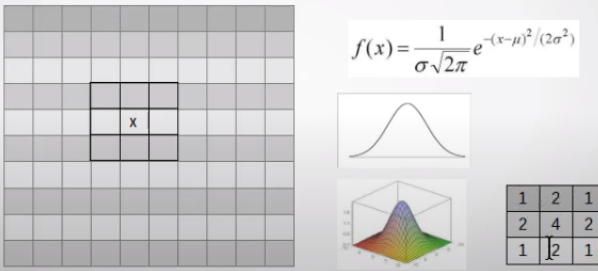

In [7]:
Image(filename = 'C:/Users/jeiss/Documents/Repositorio para JupyterLab - Jupyter Noteboock/Mineria de Datos/Proyecto/Codigo Noteboocks/Imagenes_Noteboocks_final/desen_gauss1.PNG')

In [8]:
cv2.GaussianBlur?

Docstring:
GaussianBlur(src, ksize, sigmaX[, dst[, sigmaY[, borderType]]]) -> dst
.   @brief Blurs an image using a Gaussian filter.
.   
.   The function convolves the source image with the specified Gaussian kernel. In-place filtering is
.   supported.
.   
.   @param src input image; the image can have any number of channels, which are processed
.   independently, but the depth should be CV_8U, CV_16U, CV_16S, CV_32F or CV_64F.
.   @param dst output image of the same size and type as src.
.   @param ksize Gaussian kernel size. ksize.width and ksize.height can differ but they both must be
.   positive and odd. Or, they can be zero's and then they are computed from sigma.
.   @param sigmaX Gaussian kernel standard deviation in X direction.
.   @param sigmaY Gaussian kernel standard deviation in Y direction; if sigmaY is zero, it is set to be
.   equal to sigmaX, if both sigmas are zeros, they are computed from ksize.width and ksize.height,
.   respectively (see #getGaussianKernel for 

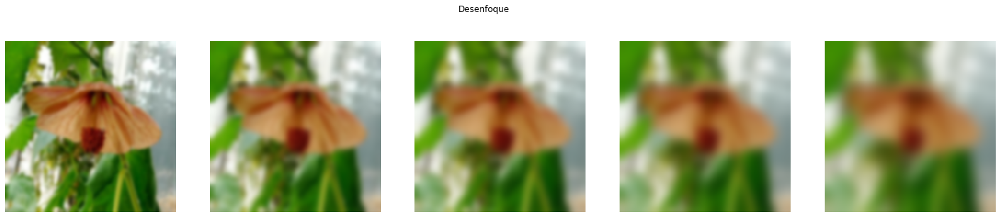

In [9]:
img = load_image(randurls[0])
# desenfoque gaussiano
img1 = cv2.GaussianBlur(img.numpy(), (13,13), 0)
img2 = cv2.GaussianBlur(img.numpy(), (25,25), 0)
img3 = cv2.GaussianBlur(img.numpy(), (35,35), 0)
img4 = cv2.GaussianBlur(img.numpy(), (47,47), 0)
img5 = cv2.GaussianBlur(img.numpy(), (61,61), 0)


fig , ax = plt.subplots(nrows=1,ncols=5,sharex=True,sharey=True,figsize=(25,5))
ax[0].imshow(img1)
ax[1].imshow(img2)
ax[2].imshow(img3)
ax[3].imshow(img4)
ax[4].imshow(img5)

ax[0].axis('off')
ax[1].axis('off')
ax[2].axis('off')
ax[3].axis('off')
ax[4].axis('off')

fig.suptitle('Desenfoque')

plt.show()

#### Replicando el codigo para un lote de imagenes

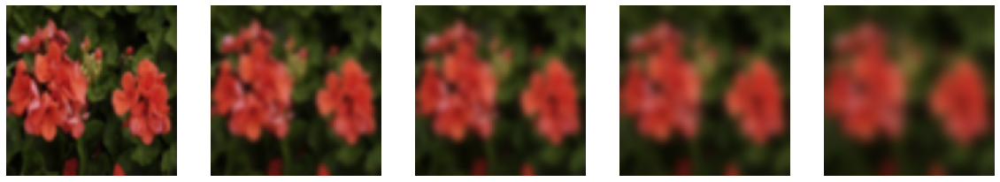

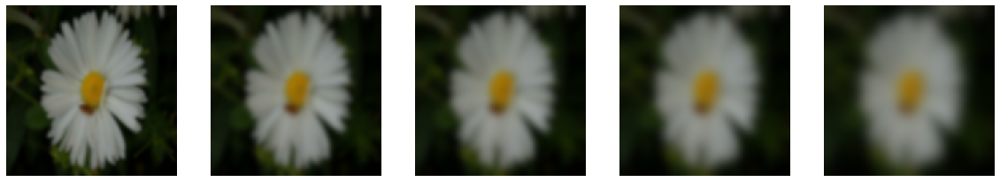

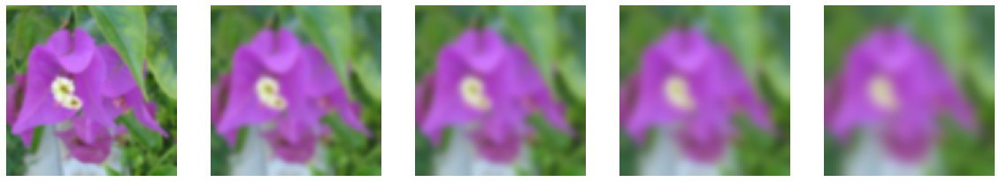

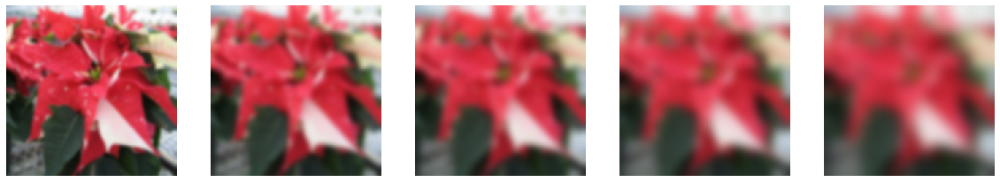

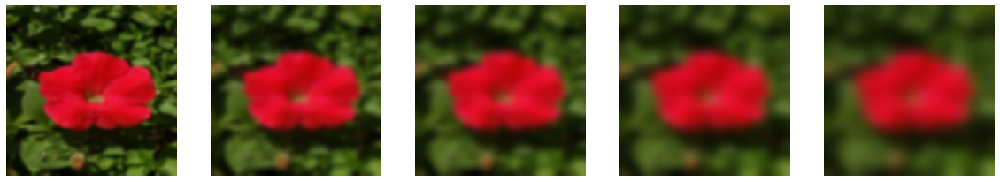

...

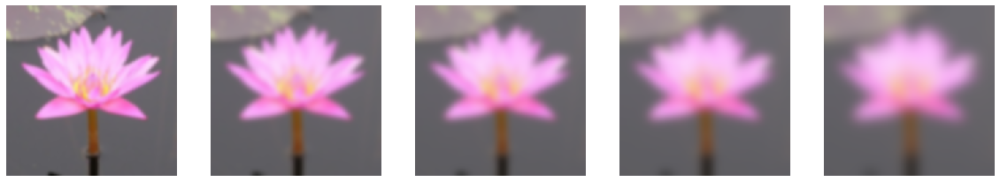

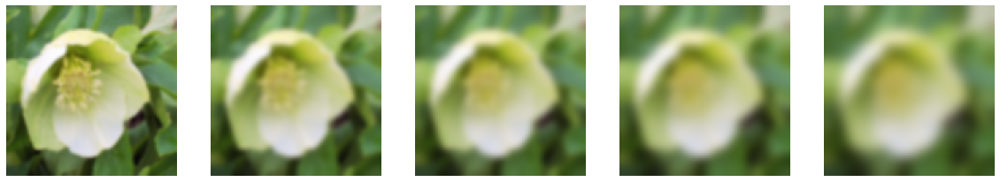

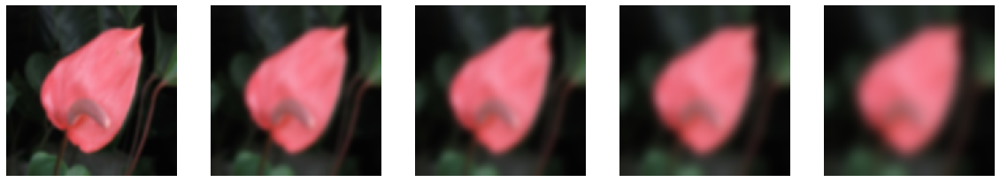

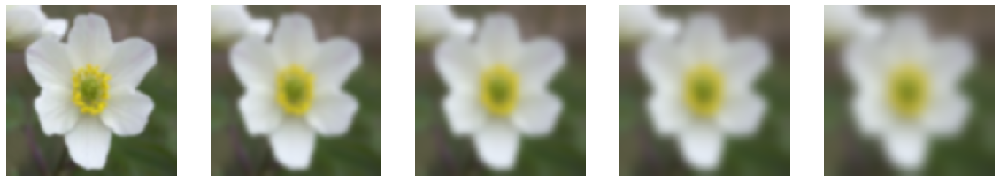

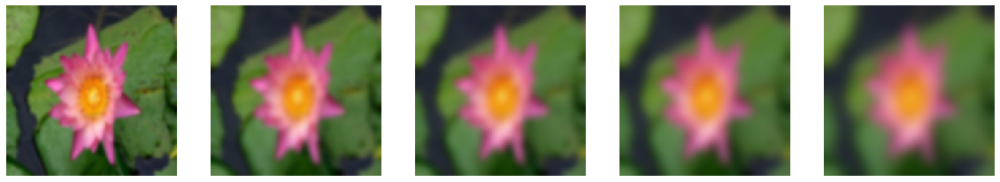

In [10]:
for i in range(35,50):
    img = load_image(randurls[i])
    img = img.numpy()
    
    img1 = cv2.GaussianBlur(img, (13,13), 0)
    img2 = cv2.GaussianBlur(img, (25,25), 0)
    img3 = cv2.GaussianBlur(img, (35,35), 0)
    img4 = cv2.GaussianBlur(img, (47,47), 0)
    img5 = cv2.GaussianBlur(img, (61,61), 0)
    
    fig , ax = plt.subplots(nrows=1,ncols=5,sharex=True,sharey=True,figsize=(20,5))

    
    ax[0].imshow(img1)
    ax[1].imshow(img2)
    ax[2].imshow(img3)
    ax[3].imshow(img4)
    ax[4].imshow(img5)
    
    ax[0].axis('off')
    ax[1].axis('off')
    ax[2].axis('off')
    ax[3].axis('off')
    ax[4].axis('off')
    
    plt.show()


## Funcion para aplicar el desenfoque de manera aleatoria
Deseamos que las imagenes sean afectadas por el desenfoque en intensidades aleatorias por lo cual generamos un vector de numeros aleatorios y aplicamos el efecto si se cumple la regla, cada imagen pasa dos veces activandoce diferentes combinaciones en secuencia. 

In [10]:
def desenfoque(img,iterations = 2):
    img = img.numpy()
    for i in range(iterations):
        ef = np.random.rand(5)
        if ef[0] >= 0.5:
            img = cv2.GaussianBlur(img, (13,13), 0)
        if ef[1] <= 0.5:
            img = cv2.GaussianBlur(img, (25,25), 0)
        if ef[2] >= 0.5:
            img = cv2.GaussianBlur(img, (35,35), 0)
        if ef[3] >= 0.5:
            img  = cv2.GaussianBlur(img, (47,47), 0)
        if ef[4] <= 0.5:
            img = cv2.GaussianBlur(img, (61,61), 0)
    return img

#### Provamos la funcion con una imagen 

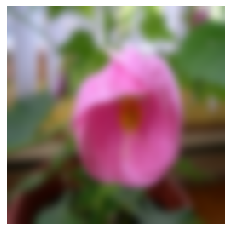

In [12]:
img = load_image(randurls[40])
img = desenfoque(img)
plt.imshow(img)
plt.axis('off')
plt.show()

#### Aplicando la funcion en lote:

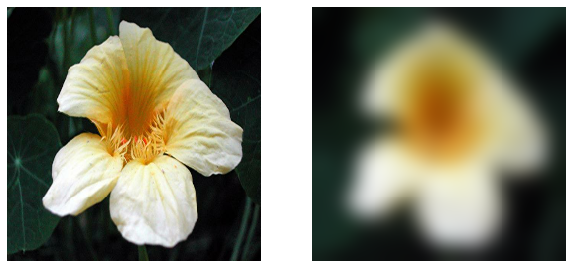

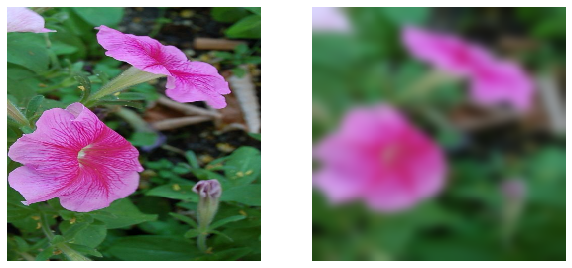

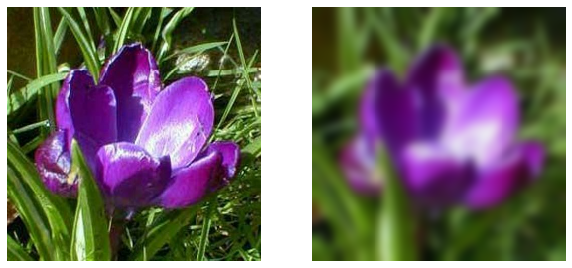

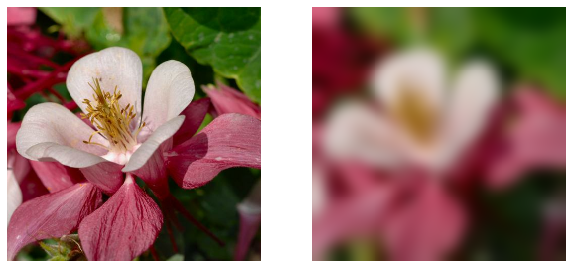

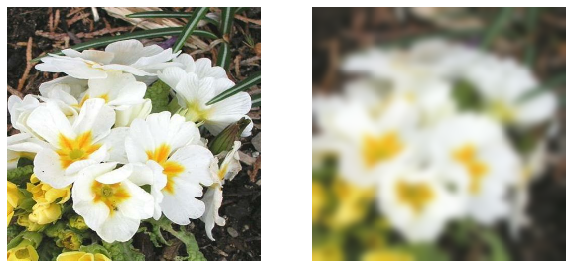

In [13]:
for i in range(20,25):
    img = load_image(randurls[i])
    imgo = img 
    img = desenfoque(img)
    fig , ax = plt.subplots(1,2,sharex=True,sharey=True,figsize = (10,5))
    ax[0].imshow(imgo)
    ax[0].axis('off')
    ax[1].imshow(img)
    ax[1].axis('off')
    plt.show()

# Generacion del dataset  de entrenamiento

#### Con El objetivo de monitorear la generacion del dataset de entrenamiento, imprimiremos la salida y limpiaremos la consola cada 50 imagenes, por otra parte se debe tener cuidado en la exportacion realizada con OpenCV (cv2)  debido a que esta asume que los colores tienen formato BGR o BGRA que es el inverso a RGB (o RGBA)

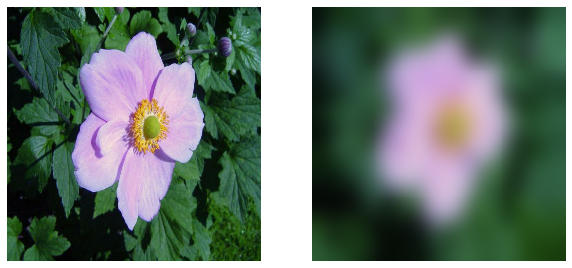

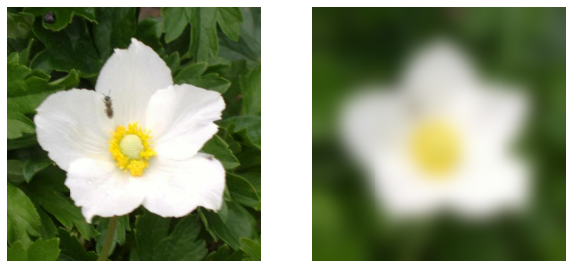

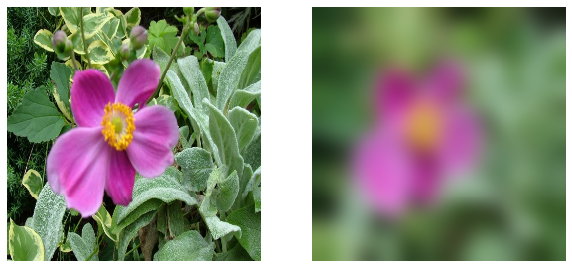

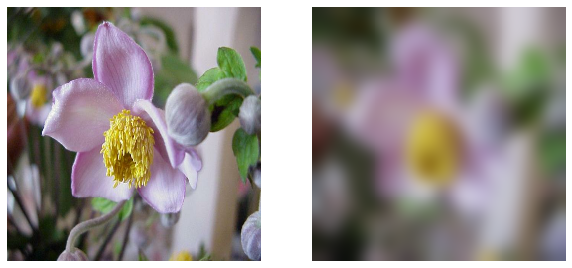

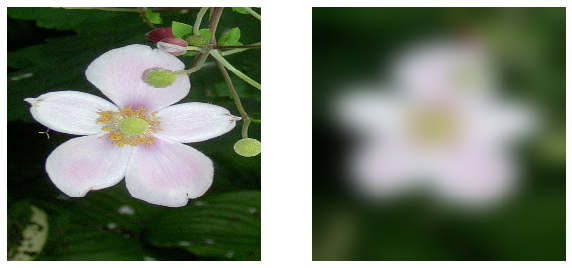

...

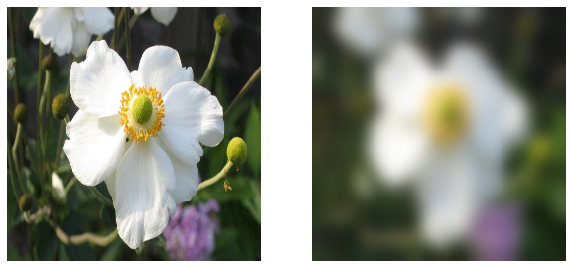

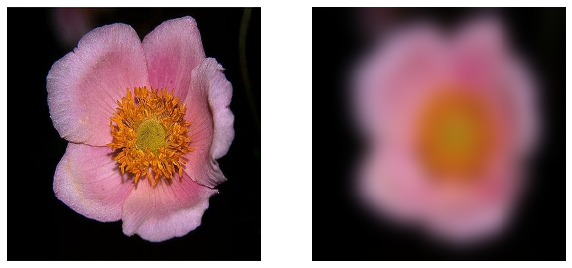

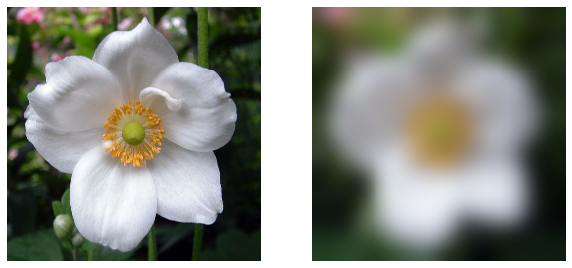

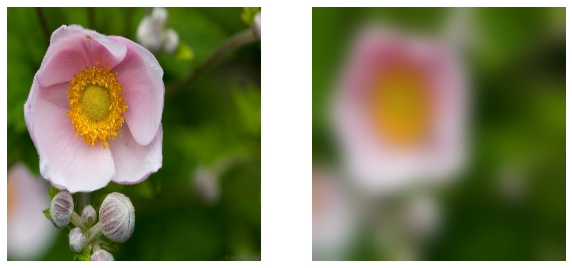

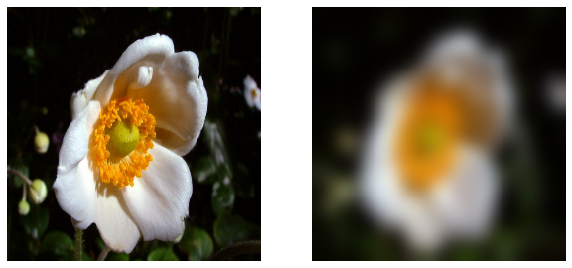

In [14]:
# skimage.io.imread carga la imagen como RGB (o RGBA), pero OpenCV asume que la imagen es BGR o BGRA
from IPython.display import clear_output
for q in range(len(imgurls)):
    filename = imgurls[q]
    img = load_image(filename)
    imgo = img 
    img = desenfoque(img = img,iterations = 4)
    fig , ax = plt.subplots(1,2,sharex=True,sharey=True,figsize = (10,5))
    ax[0].imshow(imgo)
    ax[1].imshow(img)
    ax[0].axis('off')
    ax[1].axis('off')
    cv2.imwrite(OUPATH + '/' + filename,img*255)# esta linea deberia omitirse
    tf.io.write_file(OUPATH + '2' +'/' + filename ,tf.image.encode_jpeg(img*255))
    plt.show()
    if q%50==0:
        clear_output()